In [44]:
import cv2 as cv
import numpy as np

# Take each frame
frame = cv.imread('test.png')

# Convert BGR to HSV
hsv = cv.cvtColor(frame, cv.COLOR_BGR2HSV)
print(hsv.shape)
print(hsv[18:22])

# RGB 81, 142 , 104 
# BGR 104, 142, 81
# define range of blue color in HSV
lower_blue = np.array([150,0,0])
upper_blue = np.array([255,255,255])

# Threshold the HSV image to get only blue colors
mask = cv.inRange(hsv, lower_blue, upper_blue)

# Bitwise-AND mask and original image
res = cv.bitwise_and(frame,frame, mask= mask)

cv.imshow('hsv',hsv)
cv.imshow('frame',frame)
cv.imshow('mask',mask)
cv.imshow('res',res)
k = cv.waitKey(0) 
cv.destroyAllWindows()


(51, 56, 3)
[[[  0   0 255]
  [  0   0 255]
  [  0   0 255]
  [  0   0 255]
  [  0   0 255]
  [ 60  33 210]
  [ 59 122 186]
  [ 59 156 182]
  [ 59 156 182]
  [ 59 156 182]
  [ 59 156 182]
  [ 59 156 182]
  [ 58 155 178]
  [ 29 143 123]
  [  2 209 190]
  [179 222 208]
  [179 221 210]
  [179 221 215]
  [179 215 221]
  [179 161 226]
  [178  31 233]
  [106  34 228]
  [105 114 214]
  [105 138 210]
  [105 138 211]
  [105 135 212]
  [105 132 214]
  [105 130 215]
  [105 129 215]
  [105 129 215]
  [105 130 214]
  [105 132 213]
  [105 136 212]
  [105 139 211]
  [105 133 211]
  [105  83 223]
  [ 90   7 235]
  [ 25 100 245]
  [ 25 219 251]
  [ 25 246 252]
  [ 25 246 252]
  [ 25 246 252]
  [ 25 246 252]
  [ 25 246 252]
  [ 25 246 252]
  [ 25 246 252]
  [ 25 246 252]
  [ 25 246 252]
  [ 25 246 252]
  [ 25 246 251]
  [ 25 241 250]
  [ 25 170 240]
  [ 23  10 237]
  [  0   0 255]
  [  0   0 255]
  [  0   0 255]]

 [[  0   0 255]
  [  0   0 255]
  [  0   0 255]
  [  0   0 255]
  [  0   0 255]
  [ 59  58

In [26]:
# how to find the HSV values to track
# RGB 81, 142 , 104 
# BGR 104, 142, 81
my_color = np.uint8([[[104, 142, 81]]])
hsv_color = cv.cvtColor(my_color, cv.COLOR_BGR2HSV)
print(hsv_color)

[[[ 71 110 142]]]


In [49]:
import numpy as np
import cv2 as cv

img = cv.imread('test.png', 0)
rows,cols = img.shape
cv.imshow('img1',img)

M = np.float32([[1,0,10],[0,1,5]])
print(M)
dst = cv.warpAffine(img,M,(cols,rows))

cv.imshow('img',dst)
cv.waitKey(0)
cv.destroyAllWindows()


[[ 1.  0. 10.]
 [ 0.  1.  5.]]


In [50]:
import numpy as np
import cv2 as cv

img = cv.imread('test.png', 0)
rows,cols = img.shape
cv.imshow('img1',img)

# cols-1 and rows-1 are the coordinate limits.
M = cv.getRotationMatrix2D(((cols-1)/2.0,(rows-1)/2.0),90,1)
dst = cv.warpAffine(img,M,(cols,rows))

cv.imshow('img',dst)
cv.waitKey(0)
cv.destroyAllWindows()

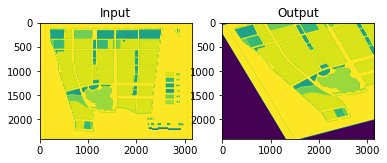

In [1]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

img = cv.imread('partition1.png', 0)
rows,cols = img.shape

pts1 = np.float32([[50,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])

M = cv.getAffineTransform(pts1,pts2)

dst = cv.warpAffine(img,M,(cols,rows))

plt.subplot(121),plt.imshow(img),plt.title('Input')
plt.subplot(122),plt.imshow(dst),plt.title('Output')
plt.show()


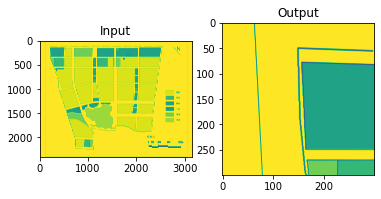

In [2]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

img = cv.imread('partition1.png', 0)
rows,cols = img.shape

pts1 = np.float32([[56,65],[368,52],[28,387],[389,390]])
pts2 = np.float32([[0,0],[300,0],[0,300],[300,300]])

M = cv.getPerspectiveTransform(pts1,pts2)

dst = cv.warpPerspective(img,M,(300,300))


plt.subplot(121),plt.imshow(img),plt.title('Input')
plt.subplot(122),plt.imshow(dst),plt.title('Output')
plt.show()

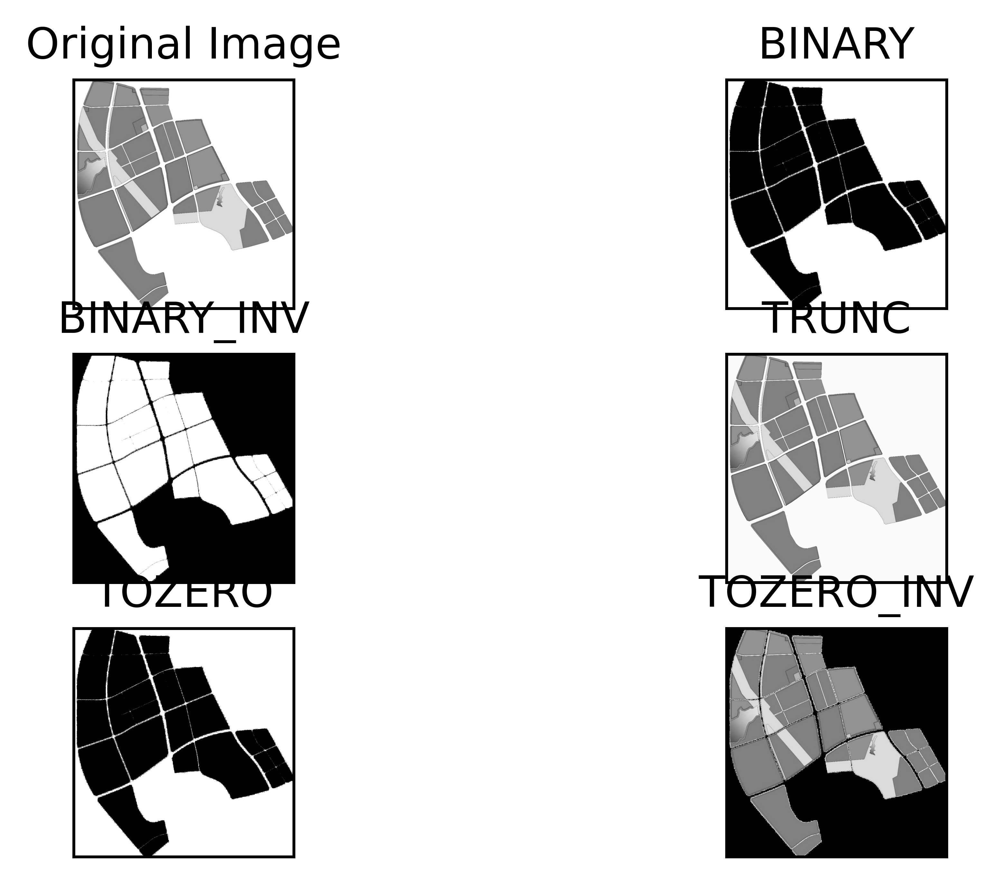

In [26]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
img = cv.imread('partition2.png',0)

thresVal = 250
maxVal = 255
ret,thresh1 = cv.threshold(img,thresVal,maxVal,cv.THRESH_BINARY)
ret,thresh2 = cv.threshold(img,thresVal,maxVal,cv.THRESH_BINARY_INV)
ret,thresh3 = cv.threshold(img,thresVal,maxVal,cv.THRESH_TRUNC)
ret,thresh4 = cv.threshold(img,thresVal,maxVal,cv.THRESH_TOZERO)
ret,thresh5 = cv.threshold(img,thresVal,maxVal,cv.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

# resize plot
# plt.figure(figsize=(20,20))
plt.figure(dpi=800)
for i in range(6):
    plt.subplot(3,2,i+1),plt.imshow(images[i],'gray',vmin=0,vmax=255)
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])

plt.show()

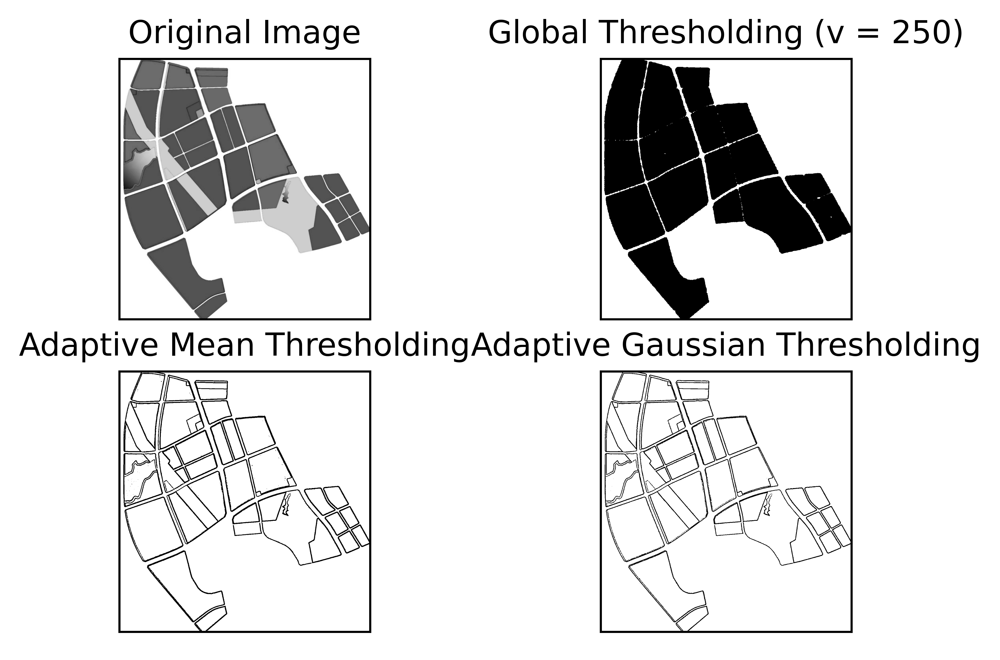

In [53]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
img = cv.imread('partition2.png',0)
img = cv.medianBlur(img,5)

globalThesVal = 250
ret,th1 = cv.threshold(img,globalThesVal,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_MEAN_C,\
            cv.THRESH_BINARY,11,2)
th3 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv.THRESH_BINARY,11,2)
titles = ['Original Image', 'Global Thresholding (v = ' + str(globalThesVal) + ')',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']

plt.figure(dpi=800)
images = [img, th1, th2, th3]
for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

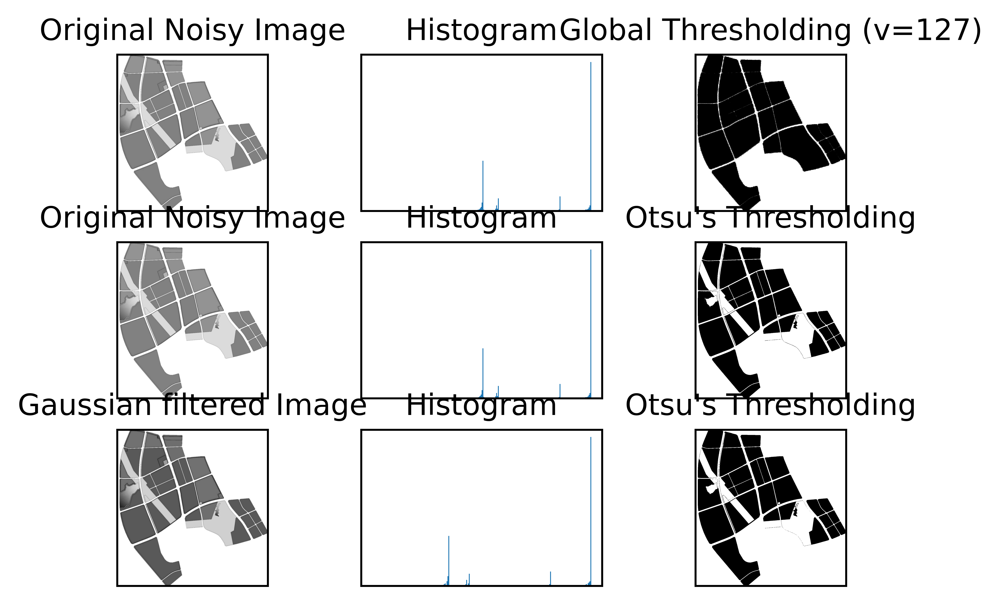

In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

img = cv.imread('partition2.png',0)

# global thresholding
ret1,th1 = cv.threshold(img,250,255,cv.THRESH_BINARY)

# Otsu's thresholding
ret2,th2 = cv.threshold(img,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)

# Otsu's thresholding after Gaussian filtering
blur = cv.GaussianBlur(img,(5,5),0)
ret3,th3 = cv.threshold(blur,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)

# plot all the images and their histograms
images = [img, 0, th1,
          img, 0, th2,
          blur, 0, th3]
titles = ['Original Noisy Image','Histogram','Global Thresholding (v=127)',
          'Original Noisy Image','Histogram',"Otsu's Thresholding",
          'Gaussian filtered Image','Histogram',"Otsu's Thresholding"]

plt.figure(dpi=800)
for i in range(3):
    plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'gray')
    plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
    
    plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel(),256)
    plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
    
    plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'gray')
    plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
plt.show()

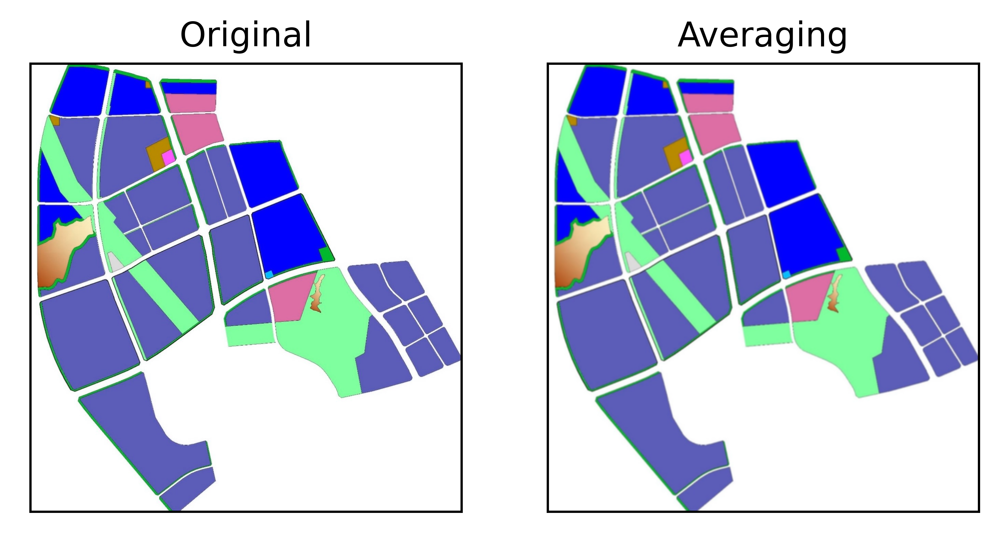

In [64]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

img = cv.imread('partition2.png')

kernel = np.ones((5,5),np.float32)/25
dst = cv.filter2D(img,-1,kernel)

plt.figure(dpi=800)
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()

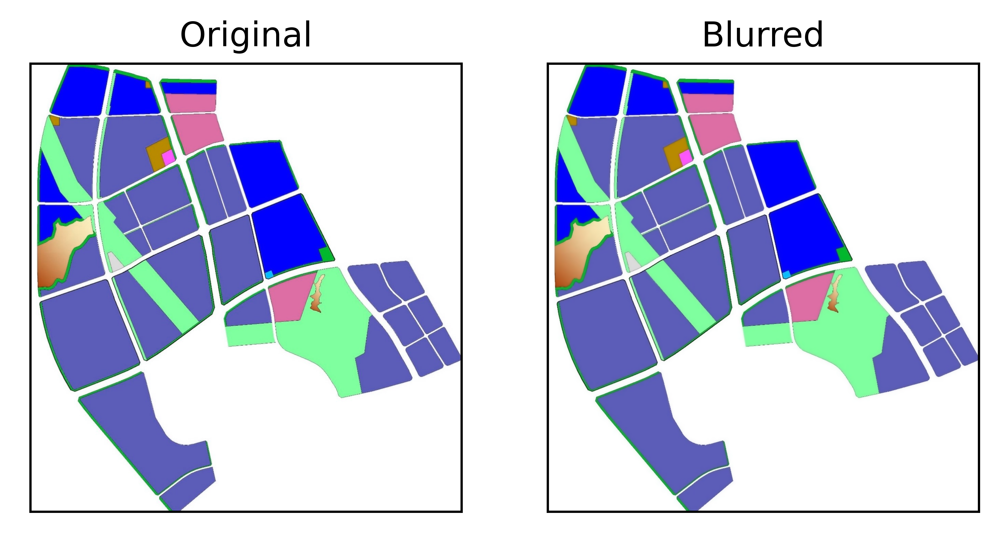

In [69]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

img = cv.imread('partition2.png')

# blur = cv.blur(img,(5,5))
# blur = cv.GaussianBlur(img,(5,5),0)
# blur = cv.medianBlur(img,5)
blur = cv.bilateralFilter(img,9,75,75)

plt.figure(dpi=800)
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(blur),plt.title('Blurred')
plt.xticks([]), plt.yticks([])
plt.show()